In [1]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')
p_features_cut=cuts['p_features_cut'][0]
p_clumpy_yes_cut=cuts['p_clumpy_yes_cut'][0]

# Task 15: Clump Arrangement?
Previous tasks: 

Task 01: Is the galaxy smooth or featured? (answer featured)

Task 12: Does the galaxy have a mostly clumpy appearance? (answer yes) 



In [2]:

#First define the task in question:
p_line='t15_clumps_arrangement_a01_line_weighted_fraction'
p_chain='t15_clumps_arrangement_a02_chain_weighted_fraction'
p_cluster='t15_clumps_arrangement_a03_cluster_weighted_fraction'
p_spiral='t15_clumps_arrangement_a04_spiral_weighted_fraction'
N_arrangement='t15_clumps_arrangement_total_weight'

#and the previous tasks:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction'
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction'

p_3 = 't16_clumps_count_a03_3_weighted_fraction'
p_4 = 't16_clumps_count_a04_4_weighted_fraction' # vote fraction for task
p_m4 = 't16_clumps_count_a05_more_than_4_fraction'
p_ct = 't16_clumps_count_a06_cant_tell_weighted_fraction'
p_multiple_clumps = 'p_multiple_clumps'
N_clump_number = 't16_clumps_count_total_weight' # number of votes for task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N =  (data[N_arrangement]>=N_cut)

featured = (data[p_features]>p_features_cut)
clumpy = (data[p_clumpy_yes]>p_clumpy_yes_cut)

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_line=[]
err_list_line=[]
fraction_list_chain=[]
err_list_chain=[]
fraction_list_cluster=[]
err_list_cluster=[]
fraction_list_spiral=[]
err_list_spiral=[]


for p in p_prev_task_list:
    task_data = (data[p_multiple_clumps]>p-.05) & (data[p_multiple_clumps]<p+.05) & min_N & featured & clumpy 

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_line.append(np.nanmean(data[task_data][p_line]))
    fraction_list_chain.append(np.nanmean(data[task_data][p_chain]))
    fraction_list_cluster.append(np.nanmean(data[task_data][p_cluster]))
    fraction_list_spiral.append(np.nanmean(data[task_data][p_spiral]))


    try:
        err_list_line.append(np.nanstd(data[task_data][p_line])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_line.append(0)
    try:
        err_list_chain.append(np.nanstd(data[task_data][p_chain])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_chain.append(0)
    try:
        err_list_cluster.append(np.nanstd(data[task_data][p_cluster])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_cluster.append(0)
    try:
        err_list_spiral.append(np.nanstd(data[task_data][p_spiral])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_spiral.append(0)


y1_line = [f+e for f,e in zip(fraction_list_line,err_list_line)]
y2_line = [f-e for f,e in zip(fraction_list_line,err_list_line)]

y1_chain = [f+e for f,e in zip(fraction_list_chain,err_list_chain)]
y2_chain = [f-e for f,e in zip(fraction_list_chain,err_list_chain)]

y1_cluster = [f+e for f,e in zip(fraction_list_cluster,err_list_cluster)]
y2_cluster = [f-e for f,e in zip(fraction_list_cluster,err_list_cluster)]

y1_spiral = [f+e for f,e in zip(fraction_list_spiral,err_list_spiral)]
y2_spiral = [f-e for f,e in zip(fraction_list_spiral,err_list_spiral)]



/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


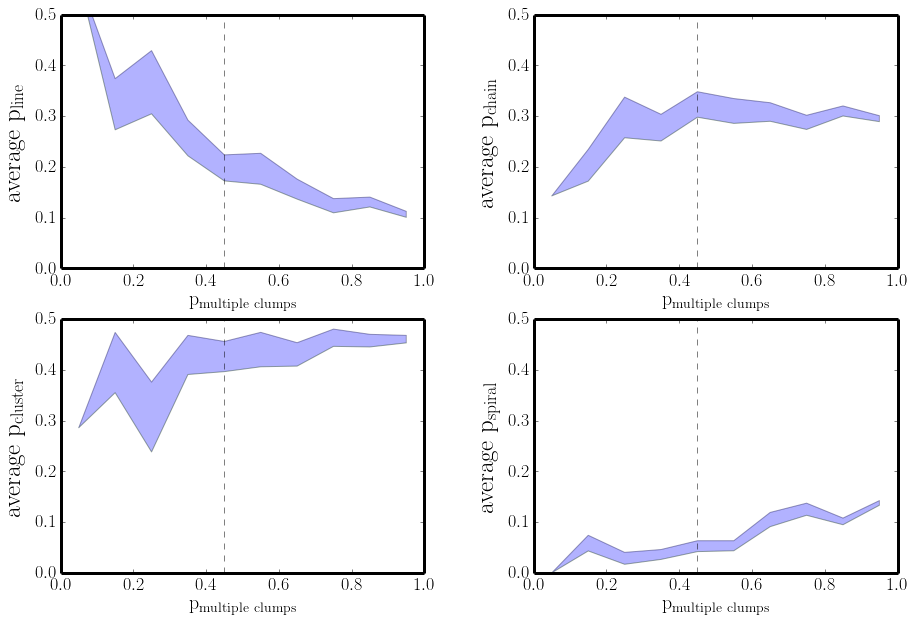

In [3]:
p_multiple_clumps_cut = .45
#p_multiple_clumps = p_3_clumps + p_4_clumps + p_more_than_4_clumps + p_can't_tell

plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(15,10))
gs=gridspec.GridSpec(2,2)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_line,alpha=.1)
plt.plot(p_prev_task_list,y2_line,alpha=.1)
plt.fill_between(p_prev_task_list,y1_line,y2_line,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{line}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{multiple~clumps}}$',fontsize=20)
plt.axvline(x=p_multiple_clumps_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_chain,alpha=.1)
plt.plot(p_prev_task_list,y2_chain,alpha=.1)
plt.fill_between(p_prev_task_list,y1_chain,y2_chain,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{chain}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{multiple~clumps}}$',fontsize=20)
plt.axvline(x=p_multiple_clumps_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[1,0])
plt.plot(p_prev_task_list,y1_cluster,alpha=.1)
plt.plot(p_prev_task_list,y2_cluster,alpha=.1)
plt.fill_between(p_prev_task_list,y1_cluster,y2_cluster,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{cluster}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{multiple~clumps}}$',fontsize=20)
plt.axvline(x=p_multiple_clumps_cut,ls='dashed',color='k',alpha=.5)

plt.subplot(gs[1,1])
plt.plot(p_prev_task_list,y1_spiral,alpha=.1)
plt.plot(p_prev_task_list,y2_spiral,alpha=.1)
plt.fill_between(p_prev_task_list,y1_spiral,y2_spiral,alpha=.3)
plt.ylim(0,.5)

plt.ylabel(r'$\mathrm{average~p_{spiral}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{multiple~clumps}}$',fontsize=20)
plt.axvline(x=p_multiple_clumps_cut,ls='dashed',color='k',alpha=.5)

## Below: Visually inspect galaxies for "clump arrangement candidates" - galaxies for which asking the clump arrangement question makes physical sense. These should be galaxies with 3 or more clumps.

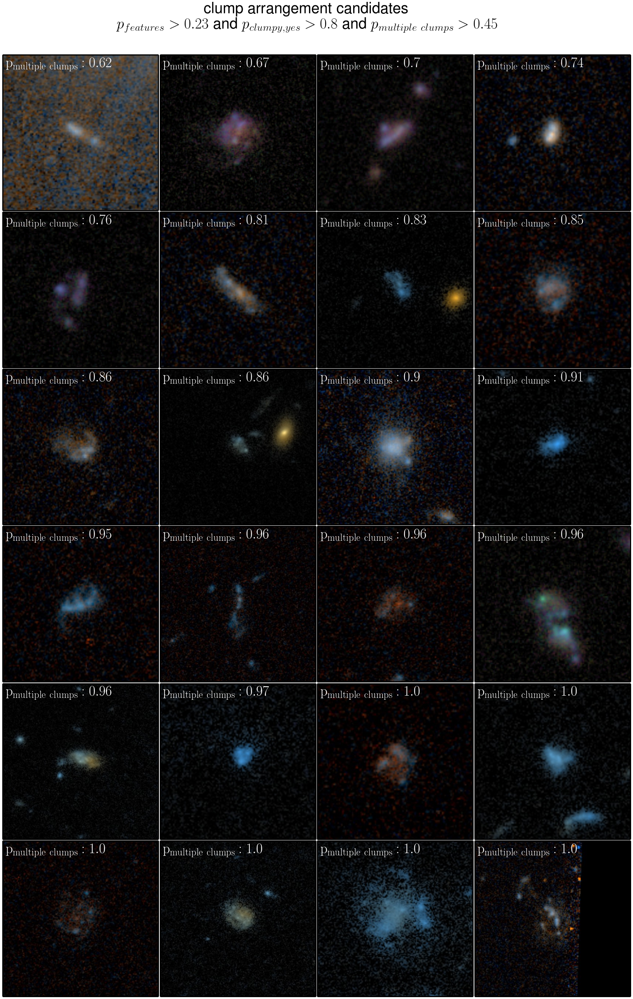

In [6]:
multiple_clumps = (data[p_multiple_clumps]>p_multiple_clumps_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & clumpy & multiple_clumps & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_multiple_clumps, column 165
random_gal_list.sort(key=itemgetter(165))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{multiple~clumps}: %s}$'%round(gal[p_multiple_clumps],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        #ax.annotate('$\mathrm{p_{clumpy,yes}: %s}$'%round(gal[p_clumpy_yes],2),fontsize=38,xy=(0.02,0.02),
         #   xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'clump arrangement candidates\n$p_{features} > %s$ and $p_{clumpy,yes} > %s$ and $p_{multiple~clumps} > %s$'%(p_features_cut,p_clumpy_yes_cut,p_multiple_clumps_cut), fontsize=40,ha='center')



## Below: The control sample; galaxies for which asking the clump arrangement question does *not* make sense. These should have fewer than 3 clumps. 

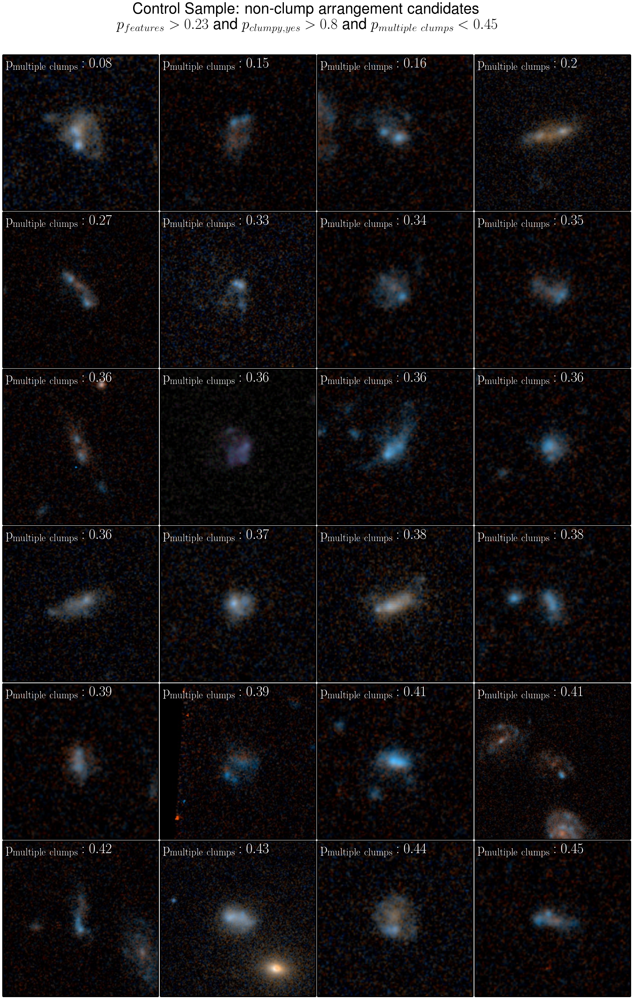

In [17]:
not_multiple_clumps = (data[p_multiple_clumps]<p_multiple_clumps_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & clumpy & not_multiple_clumps & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_multiple_clumps, column 165
random_gal_list.sort(key=itemgetter(165))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{multiple~clumps}: %s}$'%round(gal[p_multiple_clumps],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        #ax.annotate('$\mathrm{p_{clumpy,yes}: %s}$'%round(gal[p_clumpy_yes],2),fontsize=38,xy=(0.02,0.02),
         #   xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non-clump arrangement candidates\n$p_{features} > %s$ and $p_{clumpy,yes} > %s$ and $p_{multiple~clumps} < %s$'%(p_features_cut,p_clumpy_yes_cut,p_multiple_clumps_cut), fontsize=40,ha='center')



## Galaxies with $p_{features}$>0.23 and $p_{clumpy,yes}$>0.8 and $p_{multiple clumps}$>0.45 and $N_{arrangement}$>20 are good candidates for evaluating the clump arrangement question. Update cuts table with this value:

In [7]:
cuts['p_multiple_clumps_cut']=p_multiple_clumps_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')